In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import music21
import os
import glob

In [ ]:
# Function to load MIDI files from your DEAM dataset
def load_midi_files(midi_folder):
    midi_files = glob.glob(os.path.join(midi_folder, "*.mid"))
    return midi_files

In [ ]:
# Function to preprocess MIDI files into sequences
def midi_to_sequence(midi_files):
    all_notes = []
    for midi_file in midi_files:
        midi = music21.converter.parse(midi_file)
        notes = []
        for element in midi.flat.notes:
            if isinstance(element, music21.note.Note):
                notes.append(str(element.pitch))
            elif isinstance(element, music21.note.Rest):
                notes.append("rest")
        all_notes.append(notes)
    return all_notes

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
midi_folder = "/content/drive/MyDrive/DEAM_music_dataset/midi"
midi_files = load_midi_files(midi_folder)

In [ ]:
notes = midi_to_sequence(midi_files)

/usr/local/lib/python3.10/dist-packages/music21/stream/base.py:3689: Music21DeprecationWarning: .flat is deprecated.  Call .flatten() instead
  return self.iter().getElementsByClass(classFilterList)


In [ ]:
# import pickle

# # Save the notes to a pickle file
# with open('/content/drive/MyDrive/DEAM_music_dataset/notes.pkl', 'wb') as file:
#     pickle.dump(notes, file)

In [ ]:
import pickle

# Load the notes from the pickle file
with open('/content/drive/MyDrive/DEAM_music_dataset/notes.pkl', 'rb') as file:
    notes = pickle.load(file)

# Display the first few elements (optional)
print(notes[:5])

[['C6', 'A6', 'G7', 'D7', 'C6', 'A6', 'A6', 'A6', 'F5', 'F#4', 'E-7', 'G#6', 'G#6', 'F7', 'F#6', 'F#6', 'E-7', 'C#7', 'A6', 'E7', 'E-7', 'C#7', 'A6', 'C6', 'A6', 'A4', 'A4', 'E5', 'F#7', 'E-7', 'C7', 'E7', 'D4', 'E7', 'D7', 'F#6', 'F#6', 'D7', 'F5', 'E-7', 'D7', 'A6', 'D7', 'E7', 'D5', 'D4', 'E7', 'E7', 'D5', 'A5', 'F#1', 'D7', 'D7', 'D7', 'F#5', 'E5', 'D4', 'E5', 'D7', 'D5', 'A6', 'E-7', 'E-7', 'E6', 'D5', 'D4'], ['E7', 'C7', 'C7', 'B4', 'B6', 'C#7', 'B5', 'B5', 'B6', 'B-2', 'B6', 'B5', 'B5', 'B6', 'B6', 'D5', 'B6', 'B-2', 'B4', 'D7', 'E-7', 'B6', 'F#4', 'C#7', 'E7', 'B4', 'E2', 'B4', 'B6', 'B6', 'E5', 'G#6', 'B4', 'E7', 'E7', 'B-2', 'F5', 'F5', 'B4'], ['D7', 'G#6', 'E5', 'B6', 'E3', 'B3', 'G5', 'E5', 'G4', 'G4', 'E5', 'E5', 'E5', 'F7', 'E3', 'G5', 'E3', 'A6', 'E2', 'G5', 'E5', 'A6', 'E5', 'D4', 'A6', 'E5', 'G5', 'E5', 'A6', 'E5', 'A5', 'E5', 'A4', 'E5', 'G5', 'G5', 'B4', 'C#7', 'C#7', 'D4', 'E3', 'E7', 'G#6', 'B-6', 'F7', 'E7', 'B-6', 'B6', 'E5', 'B6', 'E7', 'E5', 'G6', 'B6', 'E7', '

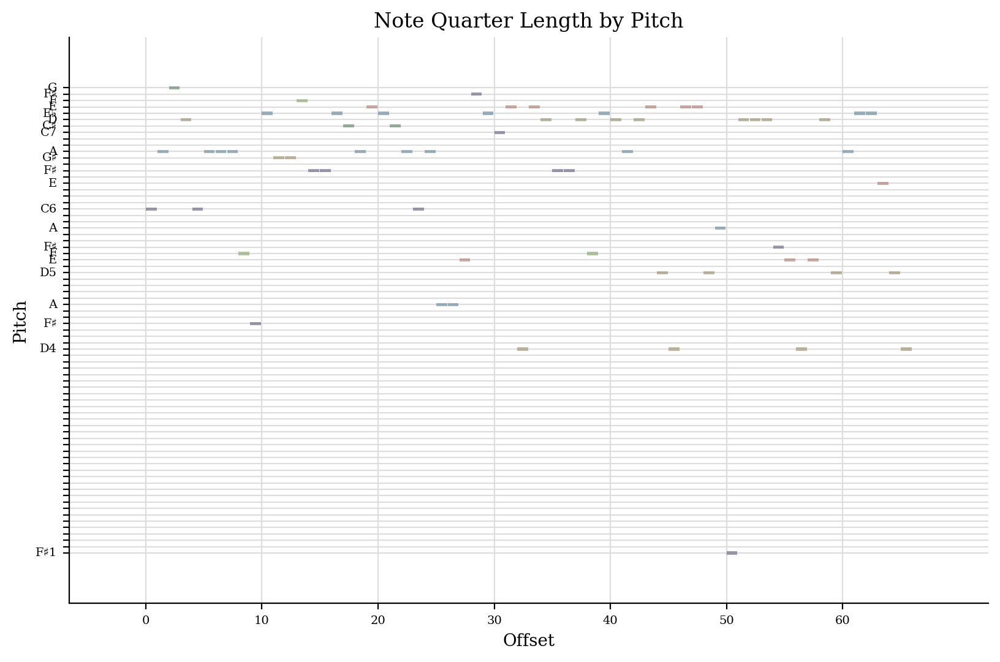

In [ ]:
from music21 import converter, midi, corpus

# Convert notes into a Stream object to visualize
stream = music21.stream.Stream()

# Add your extracted notes to the stream
for note in notes[0]:  # Visualizing notes from the first MIDI file
    if note == 'rest':
        stream.append(music21.note.Rest())
    else:
        stream.append(music21.note.Note(note))

# Plot as a piano roll
stream.plot('pianoRoll')

In [ ]:
# Create dictionary for notes
all_notes_flat = [note for sublist in notes for note in sublist]
note_vocab = sorted(set(all_notes_flat))
note_to_int = {note: number for number, note in enumerate(note_vocab)}
int_to_note = {number: note for note, number in note_to_int.items()}

# Create sequences of notes for model input
sequence_length = 100
network_input = []
network_output = []
for i in range(len(all_notes_flat) - sequence_length):
    seq_in = all_notes_flat[i:i + sequence_length]
    seq_out = all_notes_flat[i + sequence_length]
    network_input.append([note_to_int[note] for note in seq_in])
    network_output.append(note_to_int[seq_out])

# Reshape input for LSTM [samples, time steps, features]
X = np.reshape(network_input, (len(network_input), sequence_length, 1))
X = X / float(len(note_vocab))

# One-hot encode output labels
y = tf.keras.utils.to_categorical(network_output, num_classes=len(note_vocab))

In [ ]:
model = Sequential()
model.add(LSTM(512, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
model.add(Dropout(0.3))
model.add(LSTM(512))
model.add(Dropout(0.3))
model.add(Dense(256))
model.add(Dense(len(note_vocab), activation='softmax'))

model.compile(loss='categorical_crossentropy', optimizer='adam')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.fit(X, y, epochs=2, batch_size=64)

Epoch 1/2
767/767 ━━━━━━━━━━━━━━━━━━━━ 3090s 4s/step - loss: 4.0808
Epoch 2/2
767/767 ━━━━━━━━━━━━━━━━━━━━ 3138s 4s/step - loss: 4.0552


In [ ]:
# Save the entire model
model.save('/content/drive/MyDrive/DEAM_music_dataset/happy_music_generation_model.h5')

In [ ]:
# from tensorflow.keras.models import load_model

# # Load the entire model
# model = load_model('/content/drive/MyDrive/DEAM_music_dataset/happy_music_generation_model.h5')

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model

# Specify the path to your saved model
model_path = "/content/drive/MyDrive/DEAM_music_dataset/happy_music_generation_model.h5"

# Load the model
model = load_model(model_path)

print("Model loaded successfully!")

Model loaded successfully!


In [ ]:
# Save the model in the native Keras format
model.save('/content/drive/MyDrive/DEAM_music_dataset/music_generation_model.keras')

In [ ]:
# from tensorflow.keras.models import load_model

# # Load the model
# model = load_model('/content/drive/MyDrive/DEAM_music_dataset/music_generation_model.keras')

In [ ]:
def generate_music(model, note_to_int, int_to_note, sequence_length=100, n_notes=500):
    start_index = np.random.randint(0, len(network_input) - 1)
    prediction_input = network_input[start_index]
    prediction_output = []

    for note_index in range(n_notes):
        # Reshape the input for the model
        prediction_input_reshaped = np.reshape(prediction_input, (1, len(prediction_input), 1))
        prediction_input_reshaped = prediction_input_reshaped / float(len(note_vocab))

        # Predict the next note
        prediction = model.predict(prediction_input_reshaped, verbose=0)
        index = np.argmax(prediction)
        result = int_to_note[index]

        prediction_output.append(result)

        # Update the input sequence
        prediction_input.append(index)
        prediction_input = prediction_input[1:]

    return prediction_output

In [ ]:
# Generate 500 notes of music
generated_notes = generate_music(model, note_to_int, int_to_note, n_notes=150)

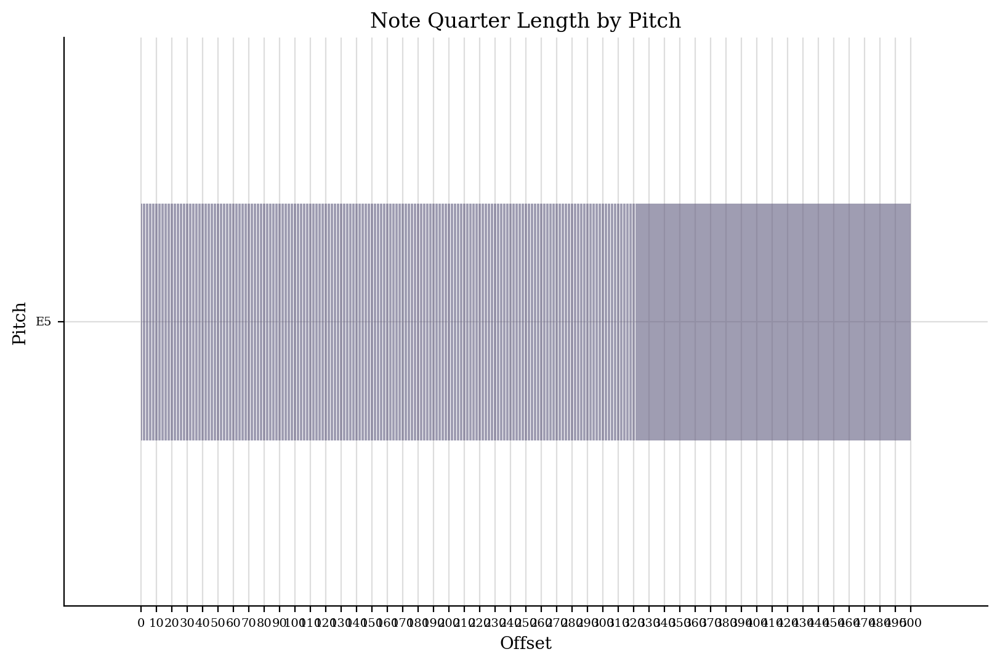

In [ ]:
from music21 import stream, note, converter

# Convert generated notes to a music21 stream for visualization
music_stream = stream.Stream()

for generated_note in generated_notes:
    if generated_note == 'rest':
        music_stream.append(note.Rest())
    else:
        music_stream.append(note.Note(generated_note))

# Visualize the notes as a piano roll
music_stream.plot('pianoRoll')

In [ ]:
def generate_midi(generated_notes, output_filename="generated_music.mid"):
    stream = music21.stream.Stream()

    for note in generated_notes:
        if '.' in note or note.isdigit():  # It's a chord
            chord_notes = note.split('.')
            chord_notes = [music21.note.Note(int(n)) for n in chord_notes]
            new_chord = music21.chord.Chord(chord_notes)
            stream.append(new_chord)
        else:  # It's a note
            new_note = music21.note.Note(note)
            stream.append(new_note)

    # Write to MIDI
    stream.write('midi', fp=output_filename)

# Generate MIDI from the notes
generate_midi(generated_notes, output_filename="generated_music.mid")

In [ ]:
pip install pydub -q

In [ ]:
pip install midi2audio -q

In [ ]:
pip install pyFluidSynth -q

In [ ]:
!apt-get install -y fluid-soundfont

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
E: Unable to locate package fluid-soundfont


In [ ]:
# Install necessary packages
!apt-get update
!apt-get install fluidsynth -y
!pip install midi2audio
!pip install pydub

Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:5 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:7 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:10 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [2,718 kB]
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/restricted amd64 Packages [3,383 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy-updates/un

In [ ]:
# Download SoundFont if not available
!wget https://schristiancollins.com/general_files/FluidR3_GM.sf2

--2024-11-19 05:21:33--  https://schristiancollins.com/general_files/FluidR3_GM.sf2
Resolving schristiancollins.com (schristiancollins.com)... 199.36.158.100
Connecting to schristiancollins.com (schristiancollins.com)|199.36.158.100|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1375 (1.3K) [text/html]
Saving to: ‘FluidR3_GM.sf2’

FluidR3_GM.sf2      100%[===================>]   1.34K  --.-KB/s    in 0s      

2024-11-19 05:21:33 (66.8 MB/s) - ‘FluidR3_GM.sf2’ saved [1375/1375]



In [ ]:
# Convert MIDI to audio using FluidSynth
from midi2audio import FluidSynth

In [ ]:
midi_file = "generated_music.mid"
output_audio_file = "generated_music.wav"

In [ ]:
# Initialize FluidSynth with the downloaded SoundFont
sound_font = "FluidR3_GM.sf2"
fs = FluidSynth(sound_font)
fs.midi_to_audio(midi_file, output_audio_file)

In [ ]:
# Verify that the WAV file is created
import os
print(f"File exists: {os.path.exists(output_audio_file)}")

File exists: True


In [ ]:
# If file exists, play it directly in the notebook
from IPython.display import Audio
Audio(output_audio_file)

In [ ]:
from google.colab import files

# Save the generated audio file in the Colab directory
# output_audio_file = "generated_music.wav"
# fs.midi_to_audio(midi_file, output_audio_file)

# Download the file to local or make it available for transfer
files.download(output_audio_file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!apt-get update
!apt-get install fluidsynth -y # Install fluidsynth using the system package manager

from midi2audio import FluidSynth

# Convert the generated MIDI file to audio (WAV format)
midi_file = "generated_music.mid"
output_audio_file = "generated_music.wav"

# Initialize FluidSynth (make sure you have a SoundFont file available)
sound_font = "FluidR3_GM.sf2"  # Assuming you have downloaded the SoundFont to your current directory
fs = FluidSynth(sound_font)
fs.midi_to_audio(midi_file, output_audio_file)

# Now you can play the generated WAV file using pydub
from pydub import AudioSegment
from pydub.playback import play

audio = AudioSegment.from_wav(output_audio_file)
play(audio)

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:7 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,165 kB]
Get:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,110 kB]
Get:9 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [2,425 kB]
Hit:10 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:12 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Hit:13 https://ppa.launchpad

In [ ]:
from pydub import AudioSegment
from pydub.playback import play

# Convert MIDI to audio (if needed) and play it
midi_file = AudioSegment.from_file("generated_music.mid", format="mid")
play(midi_file)

CouldntDecodeError: Decoding failed. ffmpeg returned error code: 1

Output from ffmpeg/avlib:

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --enable-libzmq --enable-libzvbi --enable-lv2 --enable-omx --enable-openal --enable-opencl --enable-opengl --enable-sdl2 --enable-pocketsphinx --enable-librsvg --enable-libmfx --enable-libdc1394 --enable-libdrm --enable-libiec61883 --enable-chromaprint --enable-frei0r --enable-libx264 --enable-shared
  libavutil      56. 70.100 / 56. 70.100
  libavcodec     58.134.100 / 58.134.100
  libavformat    58. 76.100 / 58. 76.100
  libavdevice    58. 13.100 / 58. 13.100
  libavfilter     7.110.100 /  7.110.100
  libswscale      5.  9.100 /  5.  9.100
  libswresample   3.  9.100 /  3.  9.100
  libpostproc    55.  9.100 / 55.  9.100
Unknown input format: 'mid'
